# Alexa Review Analysis using Artificial Neural Network (ANN) Architecture
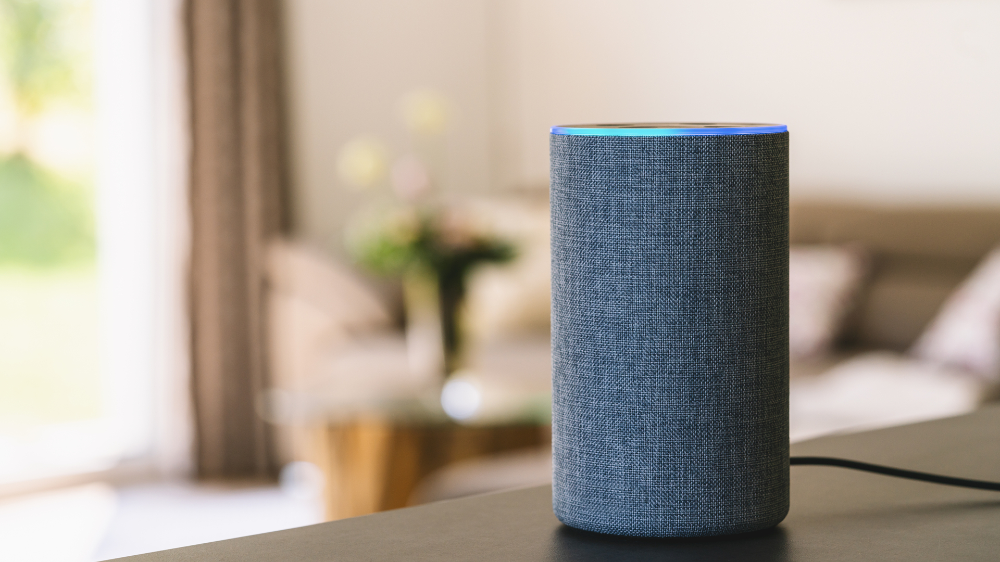

In [1]:
import pandas as pd 
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

# Reading the Dataset

In [2]:
df_alexa = pd.read_csv('amazon_alexa.tsv', sep='\t')
df_alexa

,rating,date,variation,verified_reviews,feedback
0,5,31-Jul-18,Charcoal Fabric,Love my Echo!,1
1,5,31-Jul-18,Charcoal Fabric,Loved it!,1
2,4,31-Jul-18,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,31-Jul-18,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,31-Jul-18,Charcoal Fabric,Music,1
...,...,...,...,...,...
3145,5,30-Jul-18,Black Dot,"Perfect for kids, adults and everyone in betwe...",1
3146,5,30-Jul-18,Black Dot,"Listening to music, searching locations, check...",1
3147,5,30-Jul-18,Black Dot,"I do love these things, i have them running my...",1
3148,5,30-Jul-18,White Dot,Only complaint I have is that the sound qualit...,1


# Data Analysis

In [3]:
positive = df_alexa[df_alexa['feedback']==1]

In [4]:
positive.sample(5)

,rating,date,variation,verified_reviews,feedback
577,5,10-Jun-18,White,Works well and has no obvious issues from bein...,1
1476,5,30-Jul-18,Black Show,I already had purchased the Echo and a couple ...,1
1542,5,30-Jul-18,Black Show,Great product. Like the apps that I can conne...,1
2849,5,30-Jul-18,White Dot,I like it alot. I connected it so I can play m...,1
1936,3,26-Jul-18,White Plus,Doesn't seem to hear as well as my 2nd Generat...,1


In [5]:
positive.feedback.unique()

array([1], dtype=int64)

In [6]:
negative = df_alexa[df_alexa['feedback']==0]

In [7]:
negative.sample(5)

,rating,date,variation,verified_reviews,feedback
205,2,29-Jul-18,Sandstone Fabric,It's got great sound and bass but it doesn't w...,0
418,1,13-Jul-18,Black,I wanted to use these as a radio and intercom ...,0
2823,2,30-Jul-18,Black Dot,Nope. Still a lot to be improved. For most of ...,0
566,2,11-Jun-18,Black,The second one which was a refurbished model d...,0
2500,1,30-Jul-18,Black Dot,I didn't like that almost everytime i asked Al...,0


In [8]:
df_alexa.feedback.unique()

array([1, 0], dtype=int64)

In [9]:
a = df_alexa[['rating','feedback']].astype("str")

In [10]:
import plotly.express as px
fig = px.histogram( x=a["feedback"], title='Feedback')
fig.show()

In [11]:
fig = px.histogram( x=a["rating"], title='Rating')
fig.show()

In [12]:
fig = px.histogram( x=df_alexa["variation"],color = df_alexa["feedback"], title='Variation and Feedback plot')
fig.show()

In [13]:
fig = px.histogram( x=df_alexa["variation"],color = df_alexa["rating"], title='Variation vs Rating')
fig.show()

# Modifying date column

In [14]:
df_alexa

,rating,date,variation,verified_reviews,feedback
0,5,31-Jul-18,Charcoal Fabric,Love my Echo!,1
1,5,31-Jul-18,Charcoal Fabric,Loved it!,1
2,4,31-Jul-18,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,5,31-Jul-18,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,5,31-Jul-18,Charcoal Fabric,Music,1
...,...,...,...,...,...
3145,5,30-Jul-18,Black Dot,"Perfect for kids, adults and everyone in betwe...",1
3146,5,30-Jul-18,Black Dot,"Listening to music, searching locations, check...",1
3147,5,30-Jul-18,Black Dot,"I do love these things, i have them running my...",1
3148,5,30-Jul-18,White Dot,Only complaint I have is that the sound qualit...,1


In [15]:
df_alexa = df_alexa.drop(['date', 'rating'], axis = 1)

In [16]:
df_alexa

,variation,verified_reviews,feedback
0,Charcoal Fabric,Love my Echo!,1
1,Charcoal Fabric,Loved it!,1
2,Walnut Finish,"Sometimes while playing a game, you can answer...",1
3,Charcoal Fabric,I have had a lot of fun with this thing. My 4 ...,1
4,Charcoal Fabric,Music,1
...,...,...,...
3145,Black Dot,"Perfect for kids, adults and everyone in betwe...",1
3146,Black Dot,"Listening to music, searching locations, check...",1
3147,Black Dot,"I do love these things, i have them running my...",1
3148,White Dot,Only complaint I have is that the sound qualit...,1


# Making Dummy Variable

In [17]:
variation_dummies = pd.get_dummies(df_alexa['variation'], drop_first= 'true')

In [18]:
variation_dummies

,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,White,White Dot,White Plus,White Show,White Spot
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3146,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3147,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3148,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


# Dropping the Variation Column 

In [19]:
df_alexa.drop('variation', axis = 1, inplace = True)

In [20]:
df_alexa

,verified_reviews,feedback
0,Love my Echo!,1
1,Loved it!,1
2,"Sometimes while playing a game, you can answer...",1
3,I have had a lot of fun with this thing. My 4 ...,1
4,Music,1
...,...,...
3145,"Perfect for kids, adults and everyone in betwe...",1
3146,"Listening to music, searching locations, check...",1
3147,"I do love these things, i have them running my...",1
3148,Only complaint I have is that the sound qualit...,1


# Adding dummies with main dataset

In [21]:
df_alex = pd.concat([df_alexa, variation_dummies], axis = 1)

In [22]:
df_alex

,verified_reviews,feedback,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,White,White Dot,White Plus,White Show,White Spot
0,Love my Echo!,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,Loved it!,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,"Sometimes while playing a game, you can answer...",1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,I have had a lot of fun with this thing. My 4 ...,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,Music,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,"Perfect for kids, adults and everyone in betwe...",1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3146,"Listening to music, searching locations, check...",1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3147,"I do love these things, i have them running my...",1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3148,Only complaint I have is that the sound qualit...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


# Feature Extraction

In [23]:
from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer() 
alexa_countvect = count_vect.fit_transform(df_alex['verified_reviews'])

In [24]:
alexa_countvect.shape

(3150, 4044)

In [25]:
aa=count_vect.get_feature_names()
print(count_vect.get_feature_names())

['00', '000', '07', '10', '100', '100x', '11', '1100sf', '12', '129', '12am', '15', '150', '18', '19', '1964', '1990', '1gb', '1rst', '1st', '20', '200', '2000', '2017', '229', '23', '24', '25', '29', '2nd', '2package', '30', '300', '30pm', '34', '360', '39', '3rd', '3x', '3xs', '40', '45', '48', '4am', '4ghz', '4k', '4th', '50', '54', '5am', '5ghz', '5th', '600', '62', '672', '6th', '70', '75', '79', '80', '80s', '81', '83', '85', '88', '888', '8gb', '90', '91', '911', '99', '_specifically_', 'a1', 'a19', 'abay', 'abc', 'abd', 'abilities', 'ability', 'able', 'abode', 'about', 'above', 'absolutely', 'absolutly', 'ac', 'accent', 'acceptable', 'accepting', 'access', 'accessable', 'accessible', 'accessing', 'accessories', 'accesss', 'accident', 'accidentally', 'accompanying', 'accomplish', 'accomplished', 'according', 'accordingly', 'account', 'accounts', 'accuracy', 'accurate', 'accurately', 'accustom', 'acknowledge', 'acoustical', 'across', 'act', 'acting', 'action', 'actions', 'activat

In [26]:
print(alexa_countvect.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [27]:
df_alex.drop(['verified_reviews'], axis =1, inplace = True)

In [28]:
rev = pd.DataFrame(alexa_countvect.toarray())

In [29]:
df_alexa = pd.concat([df_alex, rev],axis =1)

In [30]:
df_alexa

,feedback,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,...,4034,4035,4036,4037,4038,4039,4040,4041,4042,4043
0,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3146,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3147,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3148,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS
from wordcloud import ImageColorGenerator

# Word Plot

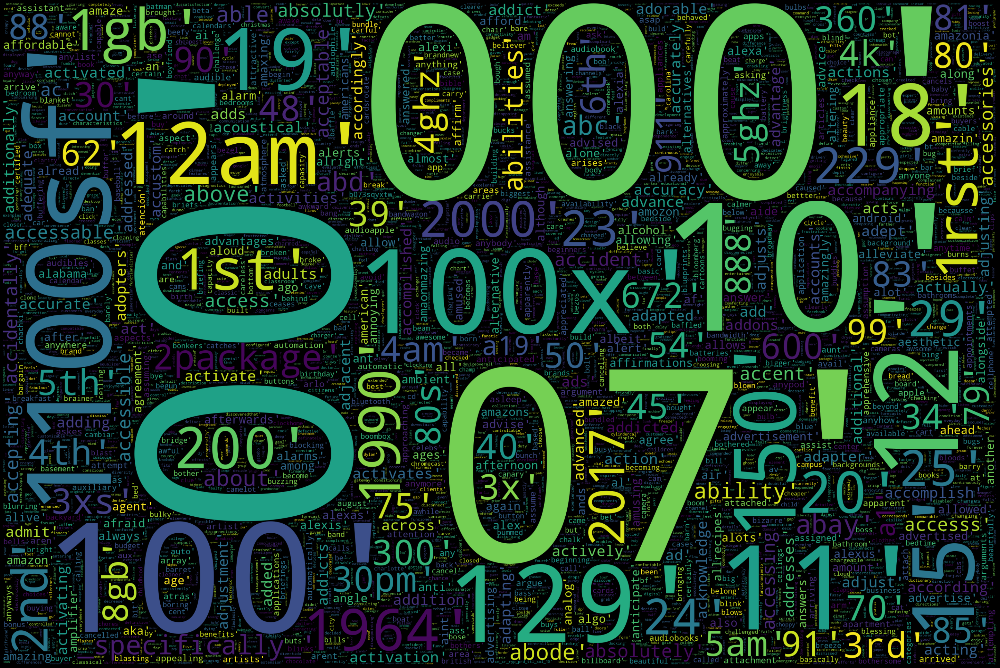

In [32]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
text = aa
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    max_words=4000,
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [33]:
X = df_alexa.drop(['feedback'], axis = 1)

In [34]:
y = df_alexa['feedback']

In [35]:
X

,Black Dot,Black Plus,Black Show,Black Spot,Charcoal Fabric,Configuration: Fire TV Stick,Heather Gray Fabric,Oak Finish,Sandstone Fabric,Walnut Finish,...,4034,4035,4036,4037,4038,4039,4040,4041,4042,4043
0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3146,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3147,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3148,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [36]:
y

0       1
1       1
2       1
3       1
4       1
       ..
3145    1
3146    1
3147    1
3148    1
3149    1
Name: feedback, Length: 3150, dtype: int64

In [37]:
print(X.shape)
print(y.shape)

(3150, 4059)
(3150,)


# Train Test Split

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [39]:
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(2520, 4059) (630, 4059)
(2520,) (630,)


# Building ANN Architecture with 5 Hidden Layers

In [40]:
classifier = tf.keras.models.Sequential()
classifier.add(tf.keras.layers.Dense(units = 400, activation = 'relu', input_shape = (4059,)))
classifier.add(tf.keras.layers.Dense(units = 600, activation = 'relu'))
classifier.add(tf.keras.layers.Dense(units = 300, activation = 'relu'))
classifier.add(tf.keras.layers.Dense(units = 700, activation = 'relu'))
classifier.add(tf.keras.layers.Dense(units = 350, activation = 'relu'))
classifier.add(tf.keras.layers.Dense(units = 1, activation = 'sigmoid', ))
classifier.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 400)               1624000   
_________________________________________________________________
dense_1 (Dense)              (None, 600)               240600    
_________________________________________________________________
dense_2 (Dense)              (None, 300)               180300    
_________________________________________________________________
dense_3 (Dense)              (None, 700)               210700    
_________________________________________________________________
dense_4 (Dense)              (None, 350)               245350    
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 351       
Total params: 2,501,301
Trainable params: 2,501,301
Non-trainable params: 0
______________________________________________

# Compiling with ADAM Optimizer and Binary Crossentropy Loss Function

In [41]:
classifier.compile(optimizer = 'Adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Fitting Dataset into the Model

In [42]:
history = classifier.fit(X_train, y_train, epochs = 10)

Epoch 1/10
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
79/79 [==============================] - 2s 21ms/step - loss: 0.2709 - accuracy: 0.9052
Epoch 2/10
79/79 [==============================] - 2s 20ms/step - loss: 0.0816 - accuracy: 0.9738 0s - loss: 0.093
Epoch 3/10
79/79 [==============================] - 2s 20ms/step - loss: 0.0275 - accuracy: 0.9917
Epoch 4/10
79/79 [==============================] - 2s 21ms/step

# Loss and Accuracy Plot

In [49]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(y=history.history['loss'], name='Loss',
                         line=dict(color='royalblue', width=3)))


In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=history.history['accuracy'],  name = 'Accuracy',
                         line=dict(color='firebrick', width=3)))

In [44]:
y_pred = classifier.predict(X_test)
y_pred = (y_pred > 0.5)
y_pred

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


array([[ True],
       [False],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [

# Confusion Matrix

In [52]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[ 27  16]
 [ 22 565]]


<AxesSubplot:>

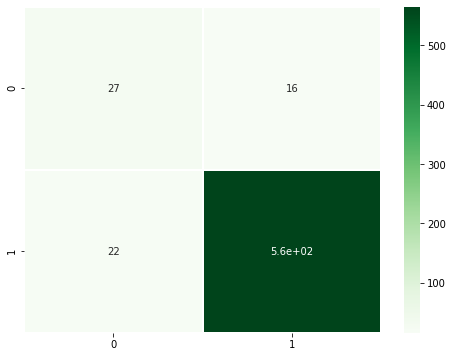

In [55]:
import matplotlib.pyplot as plt
plt.figure(figsize = (8, 6))
sns.heatmap(cm, annot = True, linewidth=1, cmap="Greens")

# Accuracy

In [51]:
from sklearn.metrics import accuracy_score
print("Accuracy",accuracy_score(y_test, y_pred))

Accuracy 0.9406825396825397


# Classification Report

In [47]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.55      0.63      0.59        43
           1       0.97      0.96      0.97       587

    accuracy                           0.94       630
   macro avg       0.76      0.80      0.78       630
weighted avg       0.94      0.94      0.94       630



## This Model can Successfully Analyse Alexa Reviews With an Accuracy of 94%